In [1]:
import sys
import pandas as pd
import numpy as np
import scipy as sp      
import matplotlib.pyplot as plt
import pickle
import seaborn as sns
import pickle

# velocity packages
import scanpy as sc
import scvelo as scv
import anndata as ann
import cellrank as cr

from scipy.sparse import issparse
from sklearn.decomposition import PCA

In [2]:
def project_to_pca(adata):
    X = adata.layers['spliced']
    V = adata.layers['velocity']

    X = np.array(X.A if issparse(X) else X)
    V = np.array(V.A if issparse(V) else V)
    V = np.nan_to_num(V, nan=0, neginf=0, posinf=0)
    Y = np.clip(X + V, 0, 1000)


    Xlog = np.log1p(X)
    pca = PCA()
    Xpca = pca.fit_transform(Xlog)

    Ylog = np.log1p(Y)
    Ypca = pca.transform(Ylog)
    Vpca = Ypca - Xpca
    return Xpca, Vpca

def process(name):
    data = f'../SVM23/data/benchmarking/{name}.h5ad'
    adata = sc.read_h5ad(data)
    scv.pp.moments(adata, n_pcs=30, n_neighbors=30)
    scv.tl.velocity(adata, mode='stochastic')
    adata.obsm['X_true'], adata.obsm['velocity_true'] = project_to_pca(adata)
    scv.tl.velocity_graph(adata)
    scv.tl.velocity_embedding(adata, basis='pca')
    return adata

In [3]:
adata = process('pancreas')

computing neighbors
    finished (0:00:11) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/32 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

/camp/home/maizelr/.local/lib/python3.10/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:00:15) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:22) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)


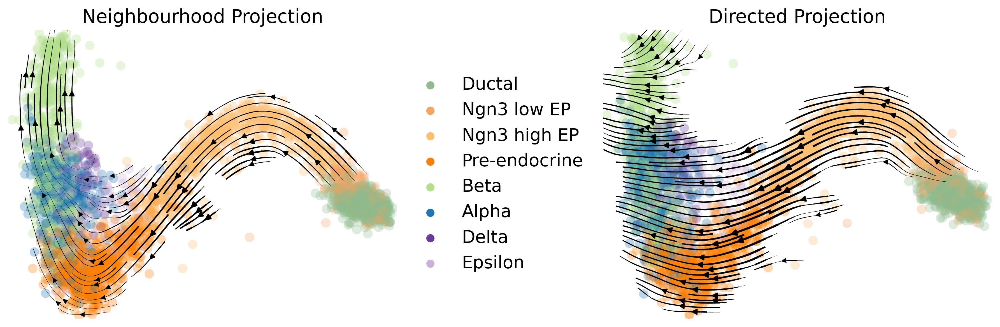

In [4]:
fig = plt.figure(figsize=(12,4), dpi=300)
ax1, ax2 = fig.subplots(1,2)

adata.uns["velocity_params"] = {'embeddings':'pca'}
scv.pl.velocity_embedding_stream(
    adata, 
    color=['clusters'],
    basis='pca', 
    legend_fontsize=15, 
    title='Neighbourhood Projection', 
    smooth=.8, 
    min_mass=4, 
    fontsize=16, 
    dpi=400, 
    ax=ax1, 
    show=False,
    legend_fontoutline=7,
    legend_loc='right margin',
    components='1,3'
)
adata.uns["velocity_params"] = {'embeddings':'true'}
scv.pl.velocity_embedding_stream(
    adata, 
    color=['clusters'],
    basis='true', 
    legend_fontsize=15, 
    title='Directed Projection', 
    smooth=.8, 
    min_mass=4, 
    fontsize=16, 
    dpi=400, 
    ax=ax2, 
    show=False,
    legend_fontoutline=7,
    legend_loc=False,
    components='1,3'
)

plt.tight_layout()
plt.savefig('figures/pancreas.png', transparent=True, bbox_inches='tight')
plt.show()

In [5]:
adata = process('dentategyrus')

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/32 cores)


  0%|          | 0/2272 [00:00<?, ?cells/s]

/camp/home/maizelr/.local/lib/python3.10/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:00:02) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:13) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)


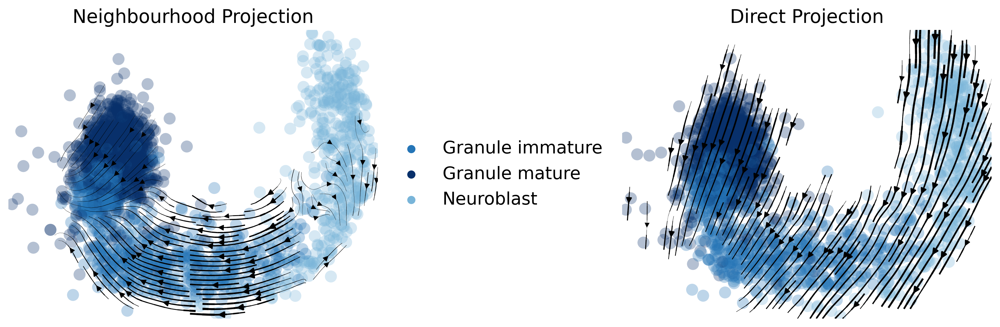

In [6]:
fig = plt.figure(figsize=(12,4), dpi=300)
ax1, ax2 = fig.subplots(1,2)

adata.uns["velocity_params"] = {'embeddings':'pca'}
scv.pl.velocity_embedding_stream(
    adata, 
    color=['clusters'],
    basis='pca', 
    legend_fontsize=15, 
    title='Neighbourhood Projection', 
    smooth=.8, 
    min_mass=4, 
    fontsize=16, 
    dpi=400, 
    ax=ax1, 
    show=False,
    legend_fontoutline=7,
    legend_loc='right margin',
    components='1,2'
)
adata.uns["velocity_params"] = {'embeddings':'true'}
scv.pl.velocity_embedding_stream(
    adata, 
    color=['clusters'],
    basis='true', 
    legend_fontsize=15, 
    title='Direct Projection', 
    smooth=.8, 
    min_mass=4, 
    fontsize=16, 
    dpi=400, 
    ax=ax2, 
    show=False,
    legend_fontoutline=7,
    legend_loc=False,
    components='1,2'
)

plt.tight_layout()
plt.savefig('figures/dentategyrus.png', transparent=True, bbox_inches='tight')
plt.show()

In [7]:
adata = process('dentategyrus_lamanno')

computing neighbors
    finished (0:00:32) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:03) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:04) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/32 cores)


  0%|          | 0/11271 [00:00<?, ?cells/s]

/camp/home/maizelr/.local/lib/python3.10/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:00:50) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:01:14) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)


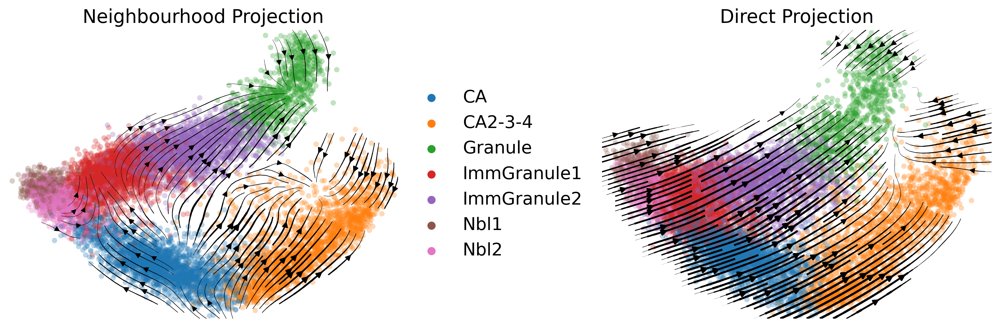

In [8]:
fig = plt.figure(figsize=(12,4), dpi=300)
ax1, ax2 = fig.subplots(1,2)

adata.uns["velocity_params"] = {'embeddings':'pca'}
scv.pl.velocity_embedding_stream(
    adata, 
    color=['clusters'],
    basis='pca', 
    legend_fontsize=15, 
    title='Neighbourhood Projection', 
    smooth=.8, 
    min_mass=4, 
    fontsize=16, 
    dpi=400, 
    ax=ax1, 
    show=False,
    legend_fontoutline=7,
    legend_loc='right margin',
    components='1,2'
)
adata.uns["velocity_params"] = {'embeddings':'true'}
scv.pl.velocity_embedding_stream(
    adata, 
    color=['clusters'],
    basis='true', 
    legend_fontsize=15, 
    title='Direct Projection', 
    smooth=.8, 
    min_mass=4, 
    fontsize=16, 
    dpi=400, 
    ax=ax2, 
    show=False,
    legend_fontoutline=7,
    legend_loc=False,
    components='1,2'
)
plt.tight_layout()
plt.savefig('figures/dentategyrus_lamanno.png', transparent=True, bbox_inches='tight')
plt.show()

In [9]:
adata = process('mouse_motor_neuron')

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/32 cores)


  0%|          | 0/1192 [00:00<?, ?cells/s]

/camp/home/maizelr/.local/lib/python3.10/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:03) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)


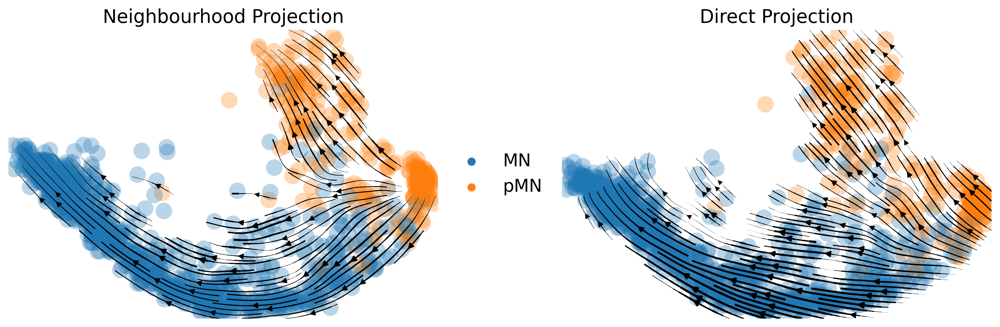

In [10]:
fig = plt.figure(figsize=(12,4), dpi=300)
ax1, ax2 = fig.subplots(1,2)

adata.uns["velocity_params"] = {'embeddings':'pca'}
scv.pl.velocity_embedding_stream(
    adata, 
    color=['cell_subtype'],
    basis='pca', 
    legend_fontsize=15, 
    title='Neighbourhood Projection', 
    smooth=.8, 
    min_mass=4, 
    fontsize=16, 
    dpi=400, 
    ax=ax1, 
    show=False,
    legend_fontoutline=7,
    legend_loc='right margin',
    components='1,2'
)
adata.uns["velocity_params"] = {'embeddings':'true'}
scv.pl.velocity_embedding_stream(
    adata, 
    color=['cell_subtype'],
    basis='true', 
    legend_fontsize=15, 
    title='Direct Projection', 
    smooth=.8, 
    min_mass=4, 
    fontsize=16, 
    dpi=400, 
    ax=ax2, 
    show=False,
    legend_fontoutline=7,
    legend_loc=False,
    components='1,2'
)
plt.tight_layout()
plt.savefig('figures/motor_neuron.png', transparent=True, bbox_inches='tight')
plt.show()

In [40]:
x2.astype(np.float32)

array([465598.,  12534., 160710., ...,  58999.,  18305.,    742.],
      dtype=float32)

In [41]:
x = np.load('muslens.npy', allow_pickle=True)
y = np.load('musunps.npy', allow_pickle=True)

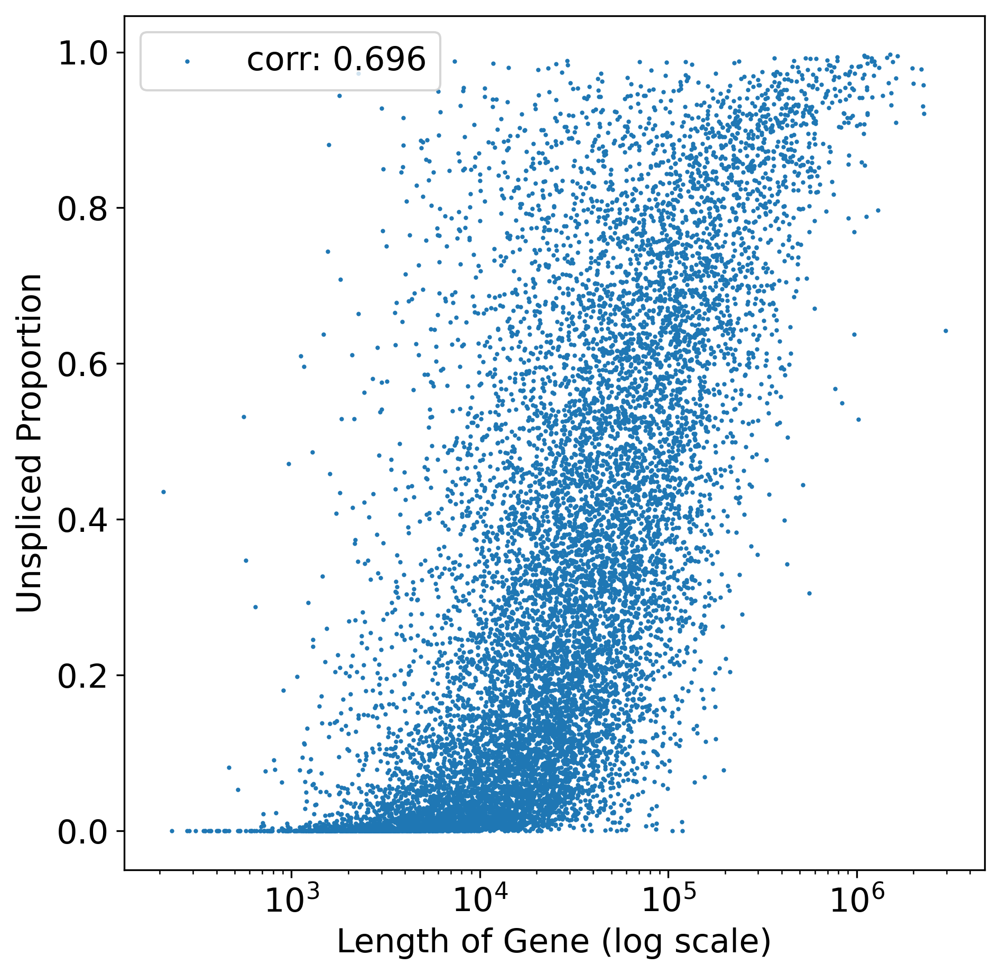

In [73]:
x2 = x[(x!=None)&(y!=None)].astype(np.float32)
y2 = y[(x!=None)&(y!=None)].astype(np.float32)

plt.figure(figsize=(7,7), dpi=300)
plt.scatter(x2, y2, s=1, label=f"corr: {np.corrcoef(np.log(x2),y2)[0,1]:.3f}")
plt.xscale('log')
plt.xlabel("Length of Gene (log scale)", fontsize=15)
plt.ylabel("Unspliced Proportion", fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.legend(fontsize=15)
plt.savefig('figures/genelength.png', bbox_inches='tight')
plt.show()

In [74]:
mus_path = "/nemo/lab/briscoej/home/users/maizelr/transcriptomics/mouse_transcriptomics_data/full_data/mouse_full_typed_velocity.loom"
hum_path = "/nemo/lab/briscoej/home/users/maizelr/transcriptomics/human_transcriptomics_analysis/data/human_full_typed_velocity.loom"
mdata = sc.read_loom(mus_path)
hdata = sc.read_loom(hum_path)

/camp/home/maizelr/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/camp/home/maizelr/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/camp/home/maizelr/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/camp/home/maizelr/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [81]:
sub = hdata[hdata.obs.timepoint=='CS12']

In [89]:
x = np.array(sub.layers['unspliced'].sum(1)) / (np.array(sub.layers['unspliced'].sum(1)) + 
                                            np.array(sub.layers['spliced'].sum(1)))             

res[tp] = x.flatten()

array([0.19479503, 0.15507934, 0.20367472, ..., 0.14391914, 0.14424191,
       0.15239718])

In [90]:
res = {}
for tp in ['CS12','CS14','CS17','CS19']:
    sub = hdata[hdata.obs.timepoint==tp]
    x = np.array(sub.layers['unspliced'].sum(1)) / (np.array(sub.layers['unspliced'].sum(1)) + 
                                                np.array(sub.layers['spliced'].sum(1)))             

    res[tp] = x.flatten()

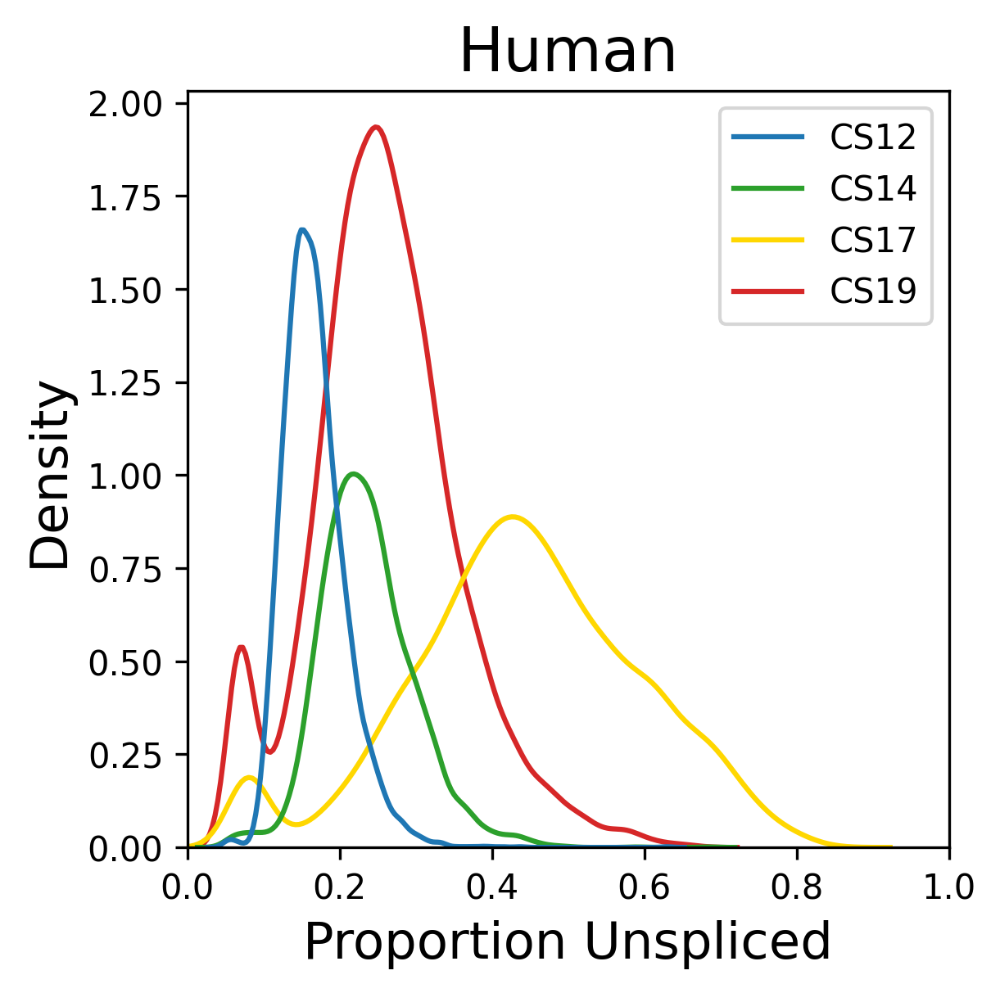

In [111]:
plt.figure(figsize=(4,4), dpi=300)
sns.kdeplot(data=res, palette={'CS12':'tab:blue','CS14':'tab:green','CS17':'gold','CS19':'tab:red'})
plt.xlabel("Proportion Unspliced", fontsize=15)
plt.ylabel("Density", fontsize=15)
plt.xlim(0,1)
plt.title("Human", fontsize=18)
plt.savefig('figures/human_splicing_proportion.png', bbox_inches='tight')
plt.show()

In [105]:
res2 = {}
for tp in mdata.obs.timepoint.unique():
    sub = mdata[mdata.obs.timepoint==tp]
    x = np.array(sub.layers['unspliced'].sum(1)) / (np.array(sub.layers['unspliced'].sum(1)) + 
                                                np.array(sub.layers['spliced'].sum(1)))             

    res2[tp] = x.flatten()

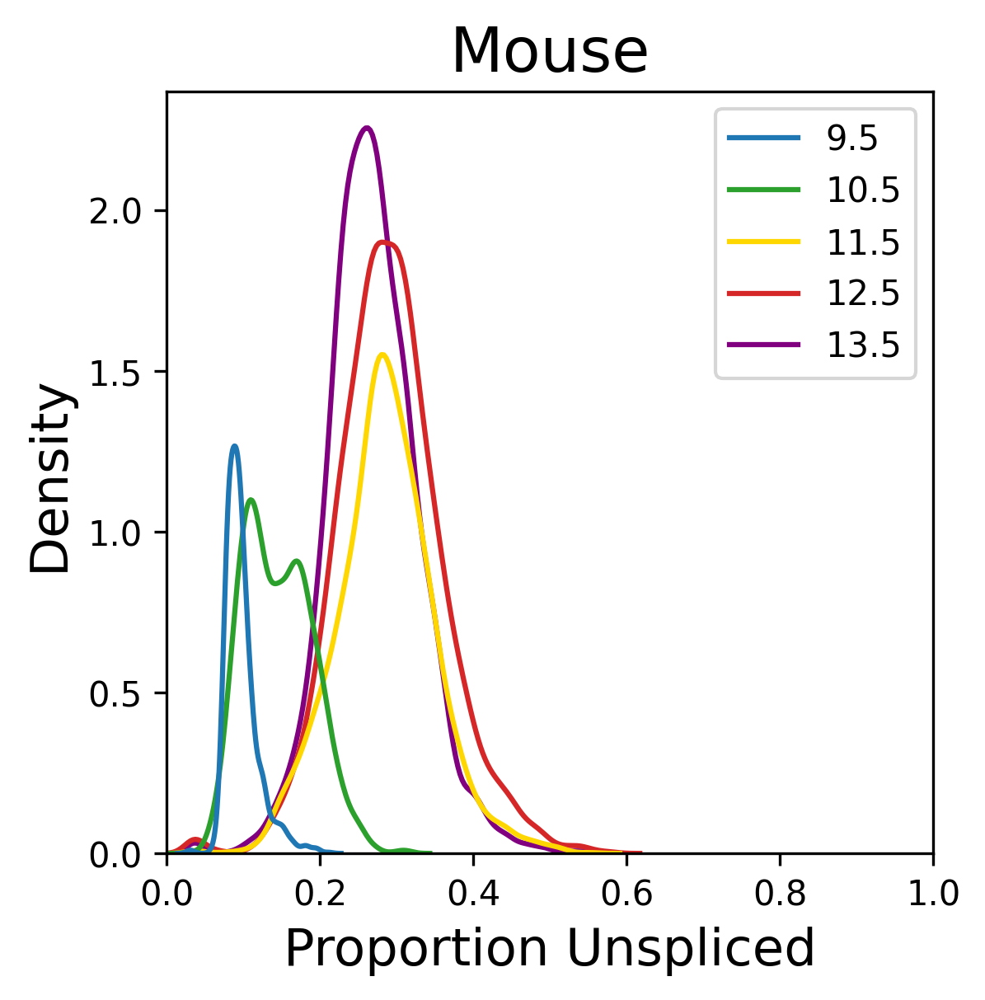

In [112]:
plt.figure(figsize=(4,4), dpi=300)
sns.kdeplot(data=res2, palette={9.5:'tab:blue',10.5:'tab:green',11.5:'gold',12.5:'tab:red',13.5:'purple'})
plt.xlabel("Proportion Unspliced", fontsize=15)
plt.ylabel("Density", fontsize=15)
plt.xlim(0,1)
plt.title("Mouse", fontsize=18)
plt.savefig('figures/mouse_splicing_proportion.png', bbox_inches='tight')
plt.show()